Generative adversarial networks (GANs), introduced in 2014 by Goodfellow, are for learning latent spaces of images. They enable the generation of fairly realistic synthetic images by forcing the generated images to be statistically almost indistinguishable from real ones.
A GAN is made of two parts:
*  Generator network—Takes as input a random vector (a random point in the
    latent space), and decodes it into a synthetic image
*  Discriminator network (or adversary)—Takes as input an image (real or synthetic),
    and predicts whether the image came from the training set or was created by
    the generator network.

  A GAN consists of a generator network coupled with a discriminator network.
The discriminator is trained to differenciate between the output of the generator
and real images from a training dataset, and the generator is trained to fool the
discriminator. Remarkably, the generator nevers sees images from the training
set directly; the information it has about the data comes from the discriminator.
 GANs are difficult to train, because training a GAN is a dynamic process rather
than a simple gradient descent process with a fixed loss landscape. Getting a
GAN to train correctly requires using a number of heuristic tricks, as well as
extensive tuning.

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

from kaggle_datasets import KaggleDatasets
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.layers import LeakyReLU, BatchNormalization, Conv2D, Add, Layer, Conv2DTranspose, Activation, ZeroPadding2D, Input
from tensorflow_addons.layers import InstanceNormalization
from keras.models import Model
from keras.activations import *
from keras.layers import *
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
print(tf.__version__)

Device: grpc://10.0.0.2:8470
Number of replicas: 8
2.4.1


In [2]:
import numpy as np
import pandas as pd
import cv2
import math
import random
import albumentations as A
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/cleaned-monet-data/cleaned_monet.tfrec
/kaggle/input/monet-tfrecords-extdata/monet_02-300.tfrec
/kaggle/input/monet-tfrecords-extdata/monet_03-300.tfrec
/kaggle/input/monet-tfrecords-extdata/monet_00-300.tfrec
/kaggle/input/monet-tfrecords-extdata/monet_01-300.tfrec
/kaggle/input/monet-tfrecords-extdata/monet_04-167.tfrec
/kaggle/input/gan-getting-started/monet_jpg/f4413e97bd.jpg
/kaggle/input/gan-getting-started/monet_jpg/7341d96c1d.jpg
/kaggle/input/gan-getting-started/monet_jpg/de6f71b00f.jpg
/kaggle/input/gan-getting-started/monet_jpg/99d94af5dd.jpg
/kaggle/input/gan-getting-started/monet_jpg/99a51d3e25.jpg
/kaggle/input/gan-getting-started/monet_jpg/d05cab011d.jpg
/kaggle/input/gan-getting-started/monet_jpg/4e05523825.jpg
/kaggle/input/gan-getting-started/monet_jpg/c68c52e8fc.jpg
/kaggle/input/gan-getting-started/monet_jpg/40d7d18ad3.jpg
/kaggle/input/gan-getting-started/monet_jpg/f96a8de9f3.jpg
/kaggle/input/gan-getting-started/monet_jpg/79224da51f.jpg
/kaggle/input

In [3]:
def set_seed(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
      
SEED = 1111
set_seed(SEED)

In [4]:
BASE_PATH = '../input/gan-getting-started'
MONET_PATH = os.path.join(BASE_PATH, 'monet_jpg')
PHOTO_PATH = os.path.join(BASE_PATH, 'photo_jpg')

In [5]:
def load_images(paths):
    images = []
    for img in paths:
        try:
            img = cv2.imread(img)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        except:
            print("Could not load {}".format(img))
        images.append(img)
    return images
        
        
def show_folder_info(path):
    d_image_sizes = {}
    for image_name in os.listdir(path):
        image = cv2.imread(os.path.join(path, image_name))
        d_image_sizes[image.shape] = d_image_sizes.get(image.shape, 0) + 1
        
    for size, count in d_image_sizes.items():
        print(f'shape: {size}\tcount: {count}')
        
def visualize_images(images):
    plt.figure(figsize=(16,16))
    
    w = int(len(images) ** .5)
    h = math.ceil(len(images) / w)
    
    
    for idx, image in enumerate(images):
        
        plt.subplot(h, w, idx + 1)
        plt.imshow(image)
        plt.axis('off')
    
    plt.show()

In [6]:
MONET_IMAGES = [os.path.join(MONET_PATH, file) for file in os.listdir(MONET_PATH)]
monet_images = load_images(MONET_IMAGES)

PHOTO_IMAGES = [os.path.join(PHOTO_PATH, file) for file in os.listdir(PHOTO_PATH)]
photo_images = load_images(PHOTO_IMAGES)

## Monet Paintings 

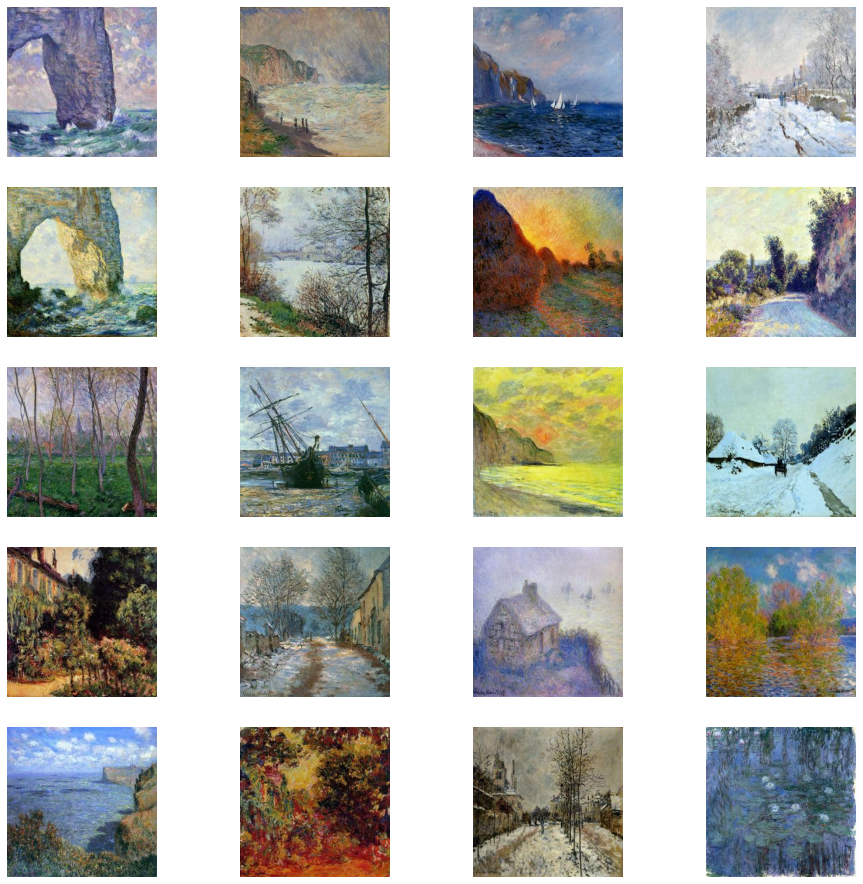

In [7]:
visualize_images(random.sample(monet_images,20))

## Photos

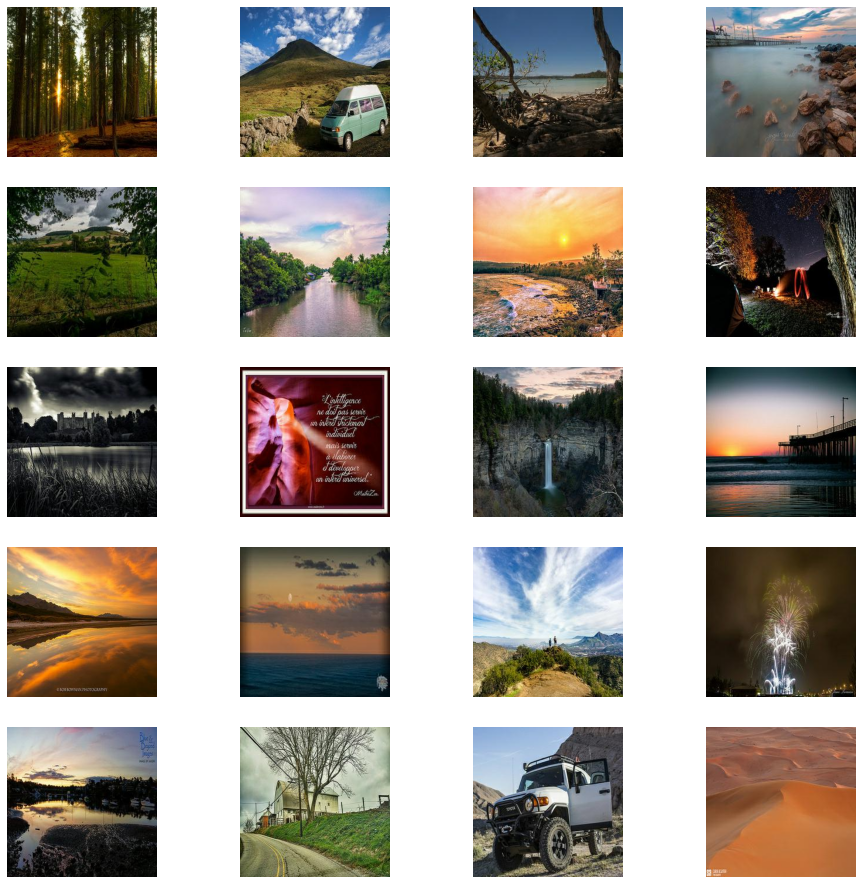

In [8]:
visualize_images(random.sample(photo_images,20))

## Grayscale

In [9]:
def grayscale_visualization(image_path, figsize=(8, 4)):
    plt.figure(figsize=figsize)
    
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    tmp_img = np.full_like(img, 0)
    for i in range(3):
        tmp_img[:, :, i] = img.mean(axis=-1)
    plt.imshow(tmp_img)
    plt.axis('off')
    
    
    plt.show()

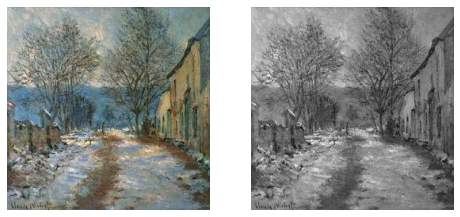

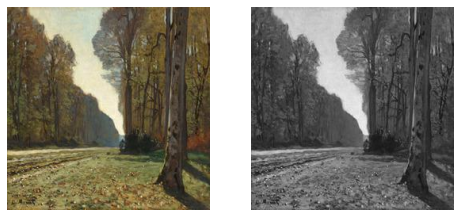

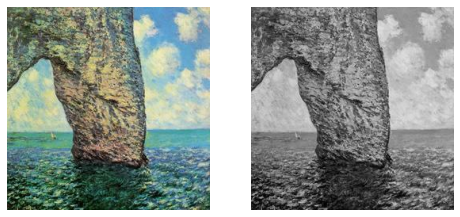

In [10]:
img_path = '../input/gan-getting-started/monet_jpg/5c79cfe0b3.jpg'
grayscale_visualization(img_path)

img_path = '../input/gan-getting-started/monet_jpg/de6f71b00f.jpg'
grayscale_visualization(img_path)

img_path = '../input/gan-getting-started/monet_jpg/6bbe0e63c6.jpg'
grayscale_visualization(img_path)

## Augmentation (Blur)

In [11]:
def plot_simple_augmentation(image_path, transform):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")

    plt.show()
    
def plot_multiple_augmentation(image_path, transform):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    plt.figure(figsize=(10, 10))
    
    plt.subplot(2, 2, 1)
    plt.imshow(img)
    plt.axis("off")
    
    plt.subplot(2, 2, 2)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")
    
    plt.subplot(2, 2, 3)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")
    
    plt.subplot(2, 2, 4)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")

    plt.show()

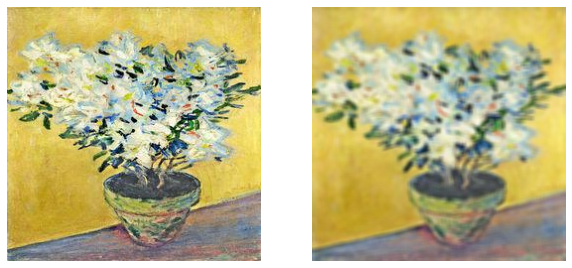

In [12]:
transform = A.Compose(
    [
        A.Blur(p=1.0, blur_limit=(5, 5)),
    ]
)

plot_simple_augmentation("../input/gan-getting-started/monet_jpg/85580214be.jpg", transform)

## Augmentation (Clahe)

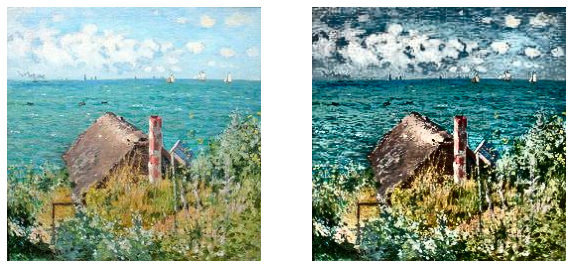

In [13]:
transform = A.CLAHE(p=1.0, clip_limit=(10, 10), tile_grid_size=(3, 3))

plot_simple_augmentation("../input/gan-getting-started/monet_jpg/b1310da865.jpg", transform)

## Augmentation (CenterCrop)

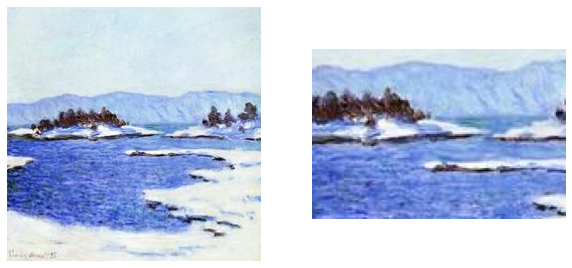

In [14]:
transform = A.CenterCrop(p=1.0, height=100, width=150)

plot_simple_augmentation("../input/gan-getting-started/monet_jpg/cd6623d07d.jpg", transform)

## Augmentation (ChanelDropout)

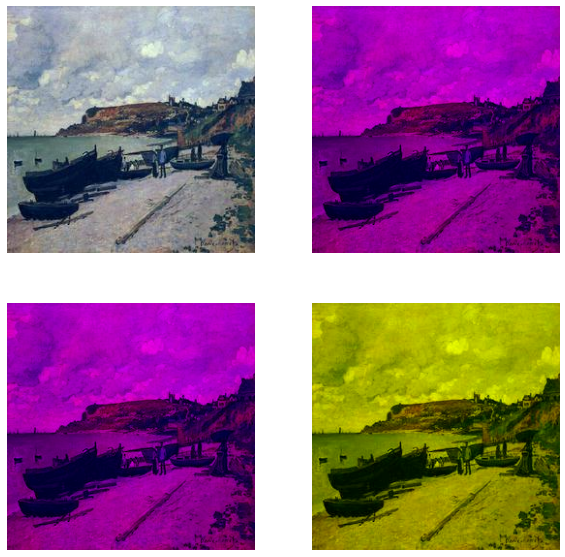

In [15]:
transform = A.ChannelDropout(p=1.0, channel_drop_range=(1, 2), fill_value=0)

plot_multiple_augmentation("../input/gan-getting-started/monet_jpg/e9f686534b.jpg", transform)

## Augmentation (ChanelShuffle)

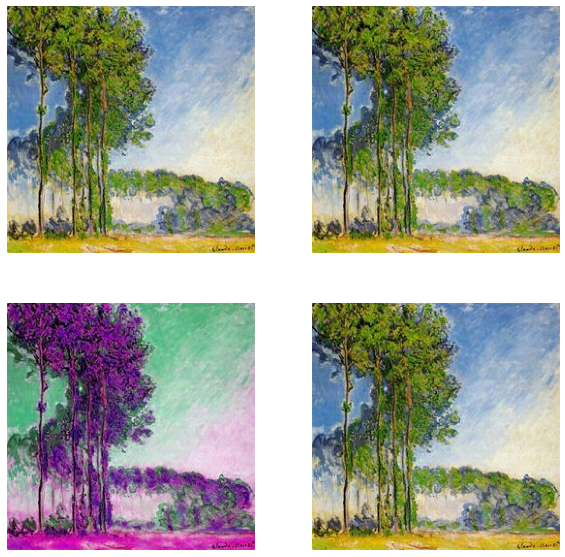

In [16]:
transform = A.ChannelShuffle(p=1.0)

plot_multiple_augmentation("../input/gan-getting-started/monet_jpg/052a77c020.jpg", transform)

## Augmentaion (Downscale)

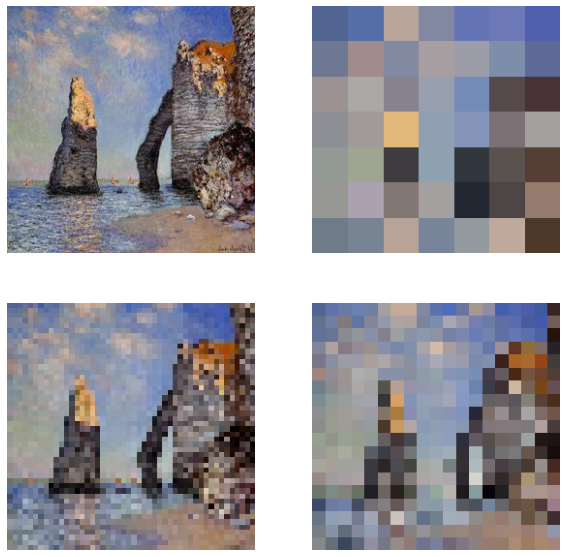

In [17]:
transform = A.Downscale(
    p=1.0, scale_min=0.01, scale_max=0.20, interpolation=0,
)

plot_multiple_augmentation(
    "../input/gan-getting-started/monet_jpg/990ed28f62.jpg",
    transform,
)

## Augmentation (Equalize)

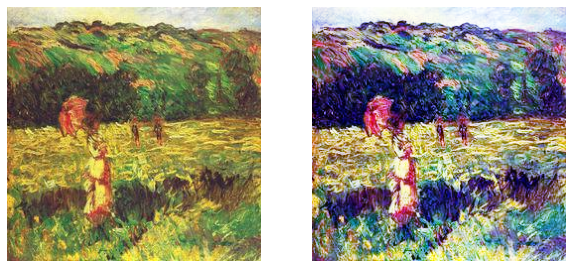

In [18]:
transform = A.Equalize(
    p=1.0, mode='cv', by_channels=True,
)

plot_simple_augmentation(
    "../input/gan-getting-started/monet_jpg/8c8011c291.jpg",
    transform,
)

## Augmentation (GaussNoise)

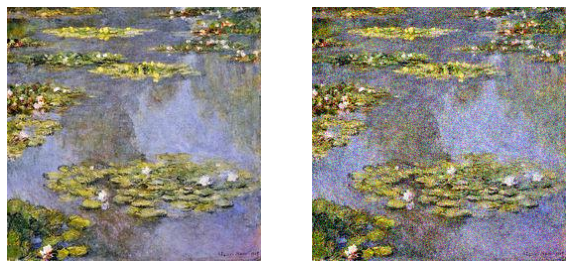

In [19]:
transform = A.GaussNoise(
    p=1.0, var_limit=(500.0, 500.0),
)

plot_simple_augmentation(
    "../input/gan-getting-started/monet_jpg/f4413e97bd.jpg",
    transform,
)

## Augmentation (HueSaturationValue)

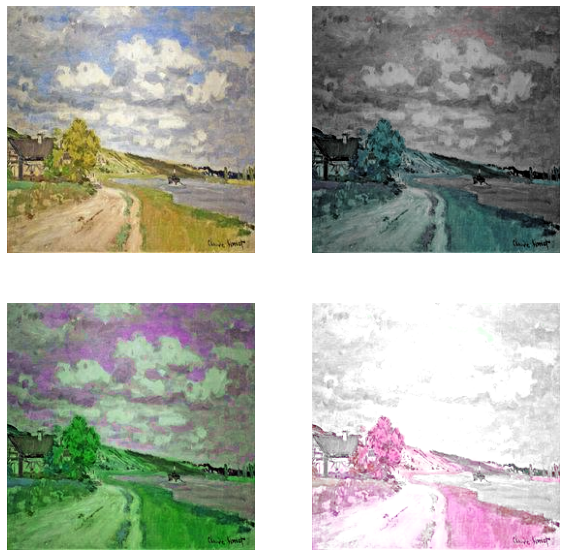

In [20]:
transform = A.HueSaturationValue(
    p=1.0, 
    hue_shift_limit=(-100, 100), 
    sat_shift_limit=(-100, 100), 
    val_shift_limit=(-100, 100),
)

plot_multiple_augmentation(
    "../input/gan-getting-started/monet_jpg/7341d96c1d.jpg",
    transform,
)

## Augmentation (ISONoise)

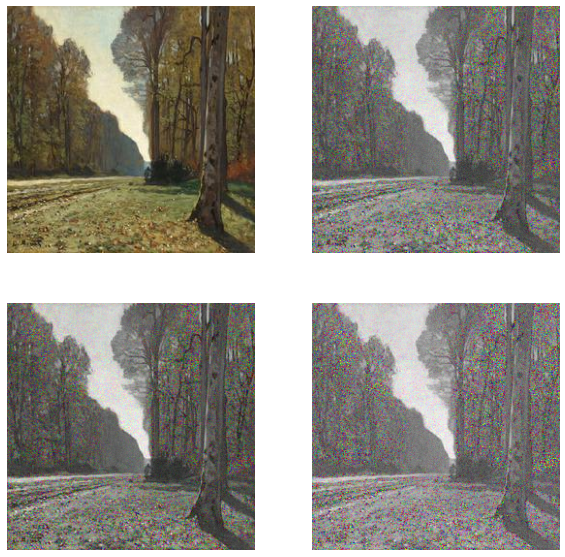

In [21]:
transform = A.ISONoise(
    p=1.0, intensity=(0.0, 2.0), color_shift=(0.0, 1.0)
)

plot_multiple_augmentation(
    "../input/gan-getting-started/monet_jpg/de6f71b00f.jpg",
    transform,
)

## Augmentation (MotionBlur)

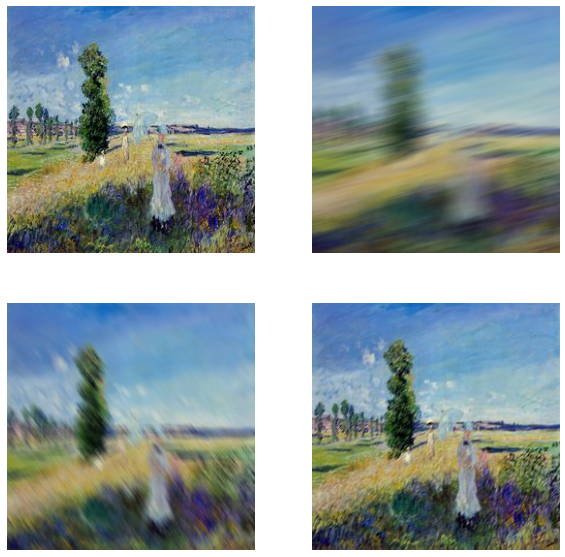

In [22]:
transform = A.MotionBlur(
    p=1.0, blur_limit=(3, 50),
)

plot_multiple_augmentation(
    "../input/gan-getting-started/monet_jpg/4e05523825.jpg",
    transform,
)

## Augmentation (MultiplicativeNoise)

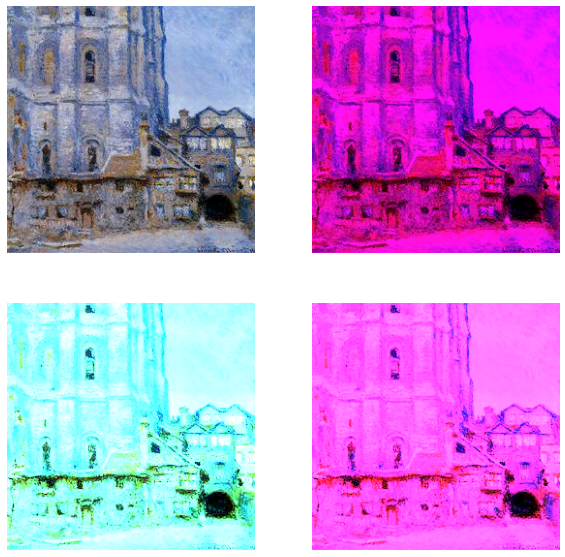

In [23]:
transform = A.MultiplicativeNoise(
    p=1.0, multiplier=(0.1, 5.0), per_channel=True, elementwise=False,
)

plot_multiple_augmentation(
    "../input/gan-getting-started/monet_jpg/066fe4cbaa.jpg",
    transform,
)

## Data Loading

In [24]:
GCS_PATH_MONET = KaggleDatasets().get_gcs_path('monet-tfrecords-extdata')
GCS_PATH = KaggleDatasets().get_gcs_path('gan-getting-started')
GCS_PATH_MONET, GCS_PATH

('gs://kds-f8b1e18c638c0a2c0551d4bef75b781c0905d8fd2029ff71f102d2c8',
 'gs://kds-5e113ef1895c151010e01fb9e375ca344c7d7dce101ddf50ef95664c')

In [25]:
import re
MONET_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/*.tfrec'))
print('Monet TFRecord Files:', len(MONET_FILENAMES))

PHOTO_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/photo_tfrec/*.tfrec'))
print('Photo TFRecord Files:', len(PHOTO_FILENAMES))

def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

n_monet_samples = count_data_items(MONET_FILENAMES)
n_photo_samples = count_data_items(PHOTO_FILENAMES)

Monet TFRecord Files: 5
Photo TFRecord Files: 20


In [26]:
IMAGE_SIZE = [256, 256]
HEIGHT_IMG = 256
WIDTH_IMG = 256
N_CHANNELS = 3

In [27]:
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

In [28]:
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

## Mirroring, Rotation, Cropping

In [29]:
def data_augment_crop(image):
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    if p_crop > .5:
        height_crop = 286
        width_crop = 286
        image = tf.image.resize(image, [height_crop, width_crop])
        image = tf.image.random_crop(image, size=[HEIGHT_IMG, WIDTH_IMG, N_CHANNELS])
        if p_crop > .9:
            height_crop = 300
            width_crop = 300
            image = tf.image.resize(image, [height_crop, width_crop])
            image = tf.image.random_crop(image, size=[HEIGHT_IMG, WIDTH_IMG, N_CHANNELS])
            
    return image

def data_augment_mirror(image):
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)

    if p_spatial > .6:
        image = tf.image.random_flip_left_right(image)
        image = tf.image.random_flip_up_down(image)
        if p_spatial > .9:
            image = tf.image.transpose(image)
            
    return image

def data_augment_rotate(image):
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)

    if p_rotate > .9:
        image = tf.image.rot90(image, k=3) # rotate 270º
    elif p_rotate > .7:
        image = tf.image.rot90(image, k=2) # rotate 180º
    elif p_rotate > .5:
        image = tf.image.rot90(image, k=1) # rotate 90º
            
    return image

In [30]:
def process_dataset(filenames, augment = False, repeat = True, shuffle = False, label = True, batch_size = 4):
    ds = load_dataset(filenames, labeled = label)
    
    if augment:
        ds = ds.map(data_augment_crop, num_parallel_calls=AUTOTUNE)
        ds = ds.concatenate(load_dataset(filenames))
        ds = ds.map(data_augment_mirror, num_parallel_calls=AUTOTUNE)
        ds = ds.concatenate(load_dataset(filenames))
        ds = ds.concatenate(load_dataset(filenames))
        ds = ds.map(data_augment_rotate, num_parallel_calls=AUTOTUNE)
        ds = ds.concatenate(load_dataset(filenames))
    if repeat:
        ds = ds.repeat(count=1)
    
    if shuffle:
        ds = ds.shuffle(2048)
    
    ds = ds.batch(batch_size,drop_remainder=True)
    ds = ds.cache()
    ds = ds.prefetch(AUTOTUNE)
    
    return ds

In [31]:
batch_s = 4
monet_ds = process_dataset(MONET_FILENAMES, augment = True, shuffle = True, batch_size = batch_s)
photo_ds = process_dataset(PHOTO_FILENAMES, augment = False, shuffle = True, batch_size = batch_s)

# Model

In [32]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

     
    result = keras.Sequential()
    # Convolutional layer
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
 # Normalization layer
    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))
 # Activation layer
    result.add(layers.LeakyReLU())

    return result

In [33]:
def upsample(filters, size, apply_dropout=False):
     # Normalization layer
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

     # Transpose convolutional layer
    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))
#Instance Normalization
    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))
# Dropout layer
    if apply_dropout:
        result.add(layers.Dropout(0.5))
# Activation layer
    result.add(layers.ReLU())

    return result

In [34]:
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

In [35]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

# CycleGAN

In [36]:
with strategy.scope():
    monet_generator = Generator() # transforms photos to Monet-esque paintings
    photo_generator = Generator() # transforms Monet paintings to be more like photos

    monet_discriminator = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator = Discriminator() # differentiates real photos and generated photos

In [37]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=15,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)
            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)
        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

## Losses

In [38]:
with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.4


In [39]:
with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True,
                                                  reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

In [40]:
with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

In [41]:
with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

## Training

In [42]:
with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(0.002, decay = 0, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(0.002, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(0.002, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(0.002, beta_1=0.5)


In [43]:
with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

In [44]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=35,
    callbacks=[callback]
)

Epoch 1/35
375/375 [==============================] - 158s 128ms/step - monet_gen_loss: 4.6313 - photo_gen_loss: 4.7727 - monet_disc_loss: 0.5288 - photo_disc_loss: 0.5252
Epoch 2/35
375/375 [==============================] - 48s 127ms/step - monet_gen_loss: 3.7048 - photo_gen_loss: 3.7684 - monet_disc_loss: 0.4866 - photo_disc_loss: 0.4955
Epoch 3/35
375/375 [==============================] - 48s 127ms/step - monet_gen_loss: 3.4608 - photo_gen_loss: 3.4767 - monet_disc_loss: 0.4669 - photo_disc_loss: 0.4786
Epoch 4/35
375/375 [==============================] - 49s 128ms/step - monet_gen_loss: 3.3082 - photo_gen_loss: 3.3983 - monet_disc_loss: 0.4774 - photo_disc_loss: 0.4791
Epoch 5/35
375/375 [==============================] - 48s 128ms/step - monet_gen_loss: 3.2373 - photo_gen_loss: 3.3852 - monet_disc_loss: 0.4836 - photo_disc_loss: 0.4571
Epoch 6/35
375/375 [==============================] - 48s 127ms/step - monet_gen_loss: 3.1464 - photo_gen_loss: 3.3352 - monet_disc_loss: 0.4987

# Visualizing the results

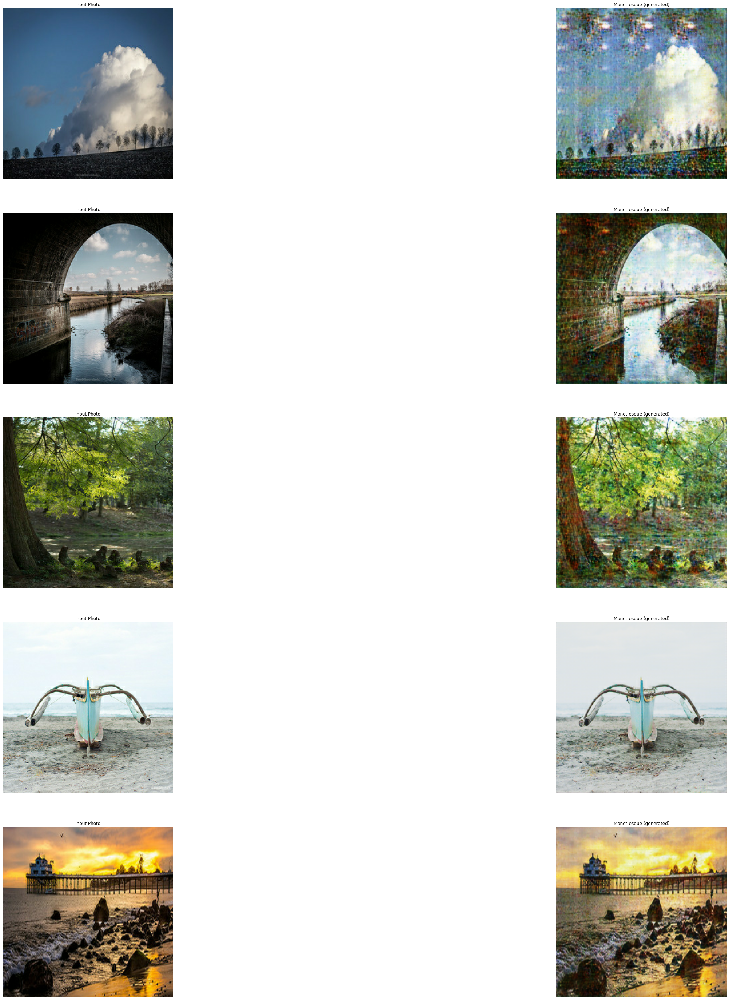

In [45]:
_, ax = plt.subplots(5, 2, figsize=(50,50))
ds_predict = load_dataset(PHOTO_FILENAMES).batch(1)
for i, img in enumerate(ds_predict.take(5)):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque (generated)")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

In [46]:
import PIL
! mkdir ../images

In [47]:
fast_photo_ds = load_dataset(PHOTO_FILENAMES).batch(32*strategy.num_replicas_in_sync).prefetch(32)

In [48]:
%%time
i = 1
for img in fast_photo_ds:
    prediction = monet_generator(img, training=False).numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    for pred in prediction:
        im = PIL.Image.fromarray(pred)
        im.save("../images/" + str(i) + ".jpg")
        i += 1

CPU times: user 31.4 s, sys: 15.2 s, total: 46.7 s
Wall time: 4min 6s


In [49]:
print(f"Generated {i} images for submission")

Generated 7039 images for submission


In [50]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'